# Xenium registration (using MERFISH to Visium pipeline)

In [11]:
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import cm
from matplotlib.lines import Line2D
import os
import glob
import torch

from scipy.stats import rankdata
import time

import imp
import tools
imp.reload(tools)

<module 'tools' from '/Users/jeanfan/Desktop/STalign/tools.py'>

<IPython.core.display.Javascript object>


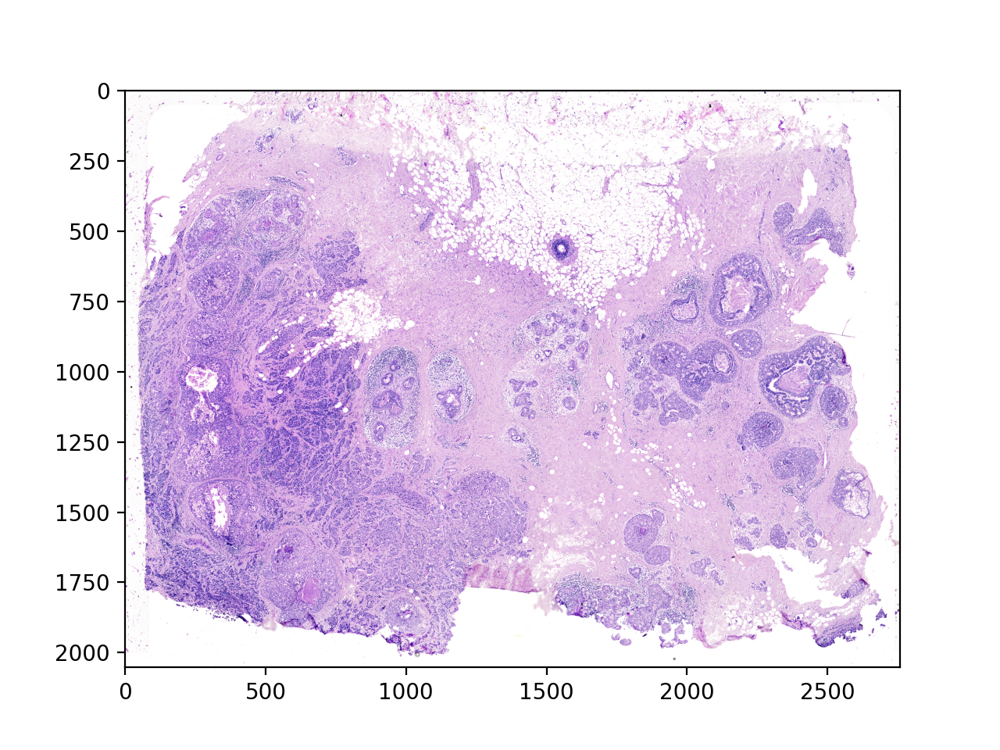

(3, 2051, 2759)

In [19]:
# Target image
visium_file = '/Users/jeanfan/Desktop/STalign/xenium_data/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.png'
V = plt.imread(visium_file)
fig,ax = plt.subplots()
ax.imshow(V)
f.canvas.draw()

V = V.transpose(2,0,1)
V.shape

In [9]:
# Single cell data to be aligned
fname = '/Users/jeanfan/Desktop/STalign/xenium_data/Xenium_FFPE_Human_Breast_Cancer_Rep1_cells.csv.gz'
df = pd.read_csv(fname)
df.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area
0,1,377.663005,843.541888,154,0,0,154,110.361875,45.562656
1,2,382.078658,858.944818,64,0,0,64,87.919219,24.248906
2,3,319.839529,869.196542,57,0,0,57,52.561875,23.526406
3,4,259.304707,851.797949,120,0,0,120,75.230312,35.176719
4,5,370.576291,865.193024,120,0,0,120,180.218594,34.499375


<IPython.core.display.Javascript object>


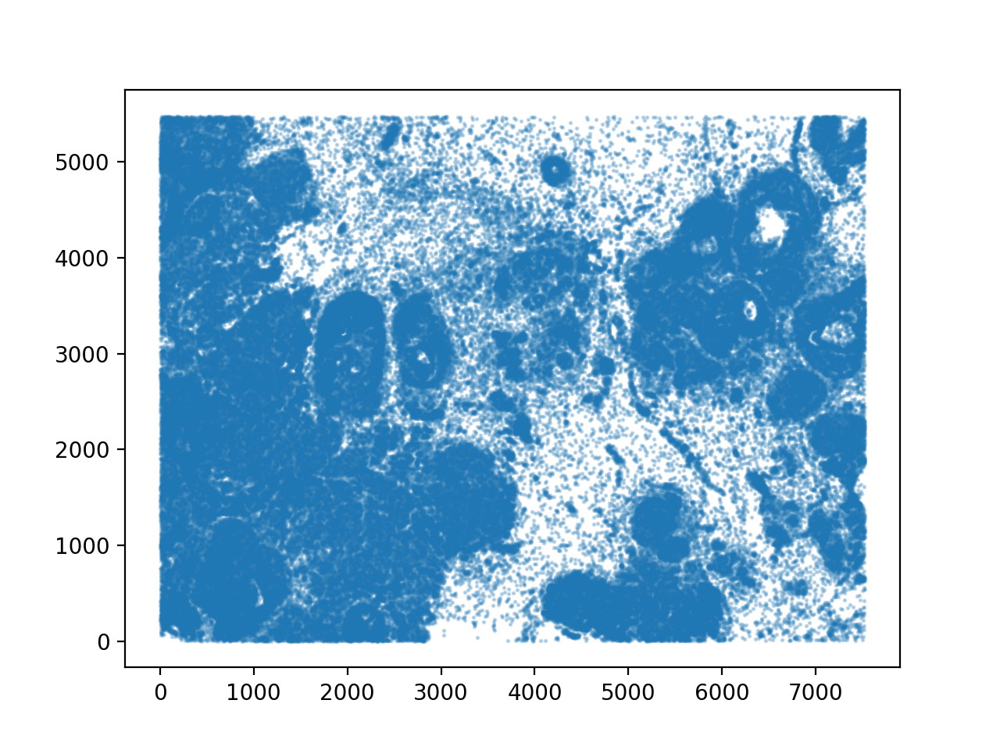

<IPython.core.display.Javascript object>


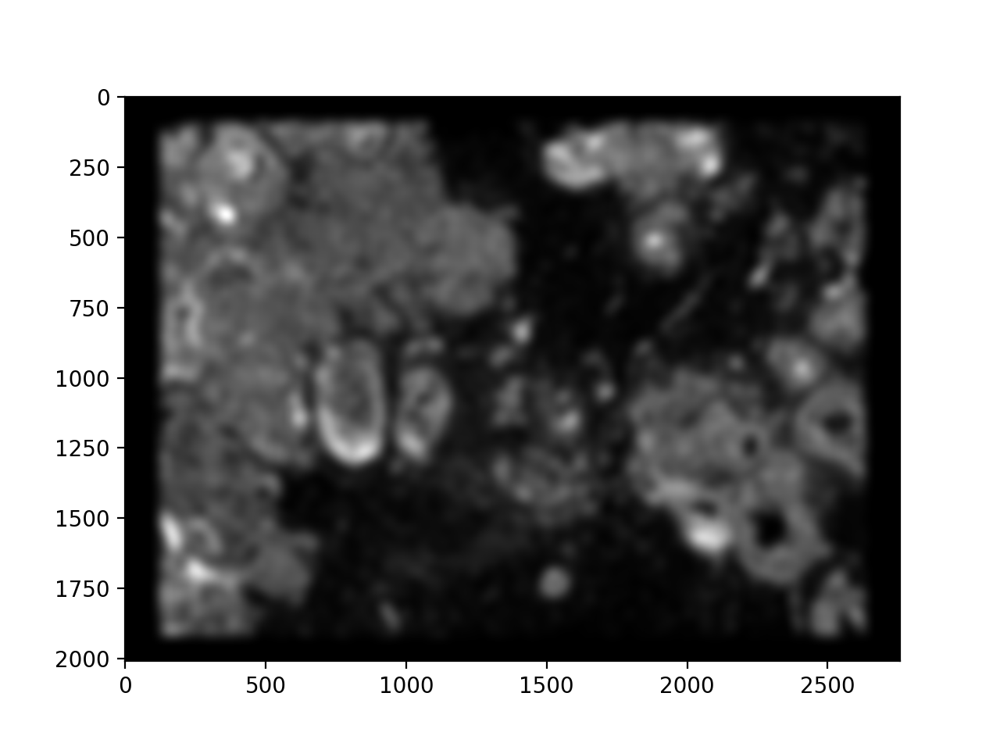

0 of 167782
10000 of 167782
20000 of 167782
30000 of 167782
40000 of 167782
50000 of 167782
60000 of 167782
70000 of 167782
80000 of 167782
90000 of 167782
100000 of 167782
110000 of 167782
120000 of 167782
130000 of 167782
140000 of 167782
150000 of 167782
160000 of 167782
167781 of 167782


(1, 2008, 2758)

In [182]:
xM = np.array(df['x_centroid'])
yM = np.array(df['y_centroid'])

fig,ax = plt.subplots()
ax.scatter(xM,yM,s=1,alpha=0.25)

X,Y,M,fig = tools.rasterize(xM,yM, dx=3.0,blur=10.0)
ax = fig.axes[0]
f.canvas.draw()

M.shape

<IPython.core.display.Javascript object>


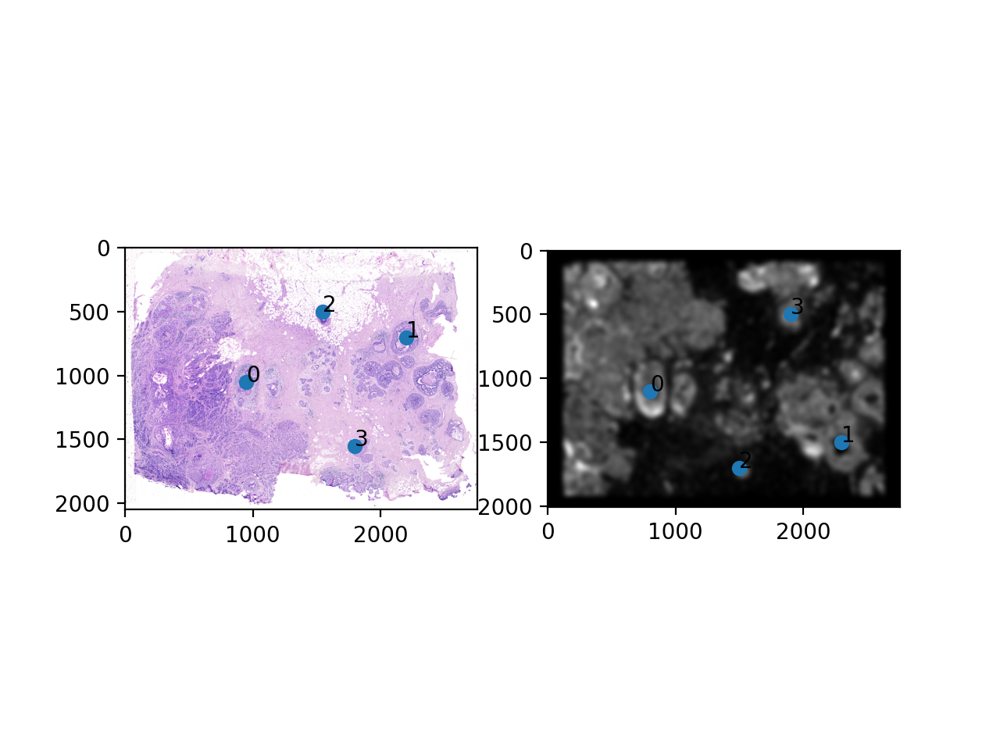

In [236]:
# jean's hack for dealing with imshow error NxMx1 is not valid
foo = np.vstack((M, M, M))
foo.shape

# manually scale to approx same size?
# make points as J and image as I since image is more encompassing this time
J = tools.normalize(foo)
YJ = np.array(range(J.shape[1]))*1.
XJ = np.array(range(J.shape[2]))*1.

I = tools.normalize(V).astype(J.dtype)
YI = np.array(range(I.shape[1]))*1.
XI = np.array(range(I.shape[2]))*1.

extentI = tools.extent_from_x((YI,XI))
extentJ = tools.extent_from_x((YJ,XJ))

# manually make points
pointsI = np.array([[1050.,950.], [700., 2200.], [500., 1550.], [1550., 1800.]])
pointsJ = np.array([[1100.,800.], [1500., 2300.], [1700., 1500.], [500., 1900.]])

# plot
fig,ax = plt.subplots(1,2)
ax[0].imshow((I/I.max()).transpose(1,2,0).squeeze(), extent=extentI)
ax[1].imshow((J).transpose(1,2,0), extent=extentJ)

ax[0].scatter(pointsI[:,1],pointsI[:,0])
ax[1].scatter(pointsJ[:,1],pointsJ[:,0])
for i in range(pointsI.shape[0]):
    ax[0].text(pointsI[i,1],pointsI[i,0],f'{i}')
    ax[1].text(pointsJ[i,1],pointsJ[i,0],f'{i}')

<IPython.core.display.Javascript object>


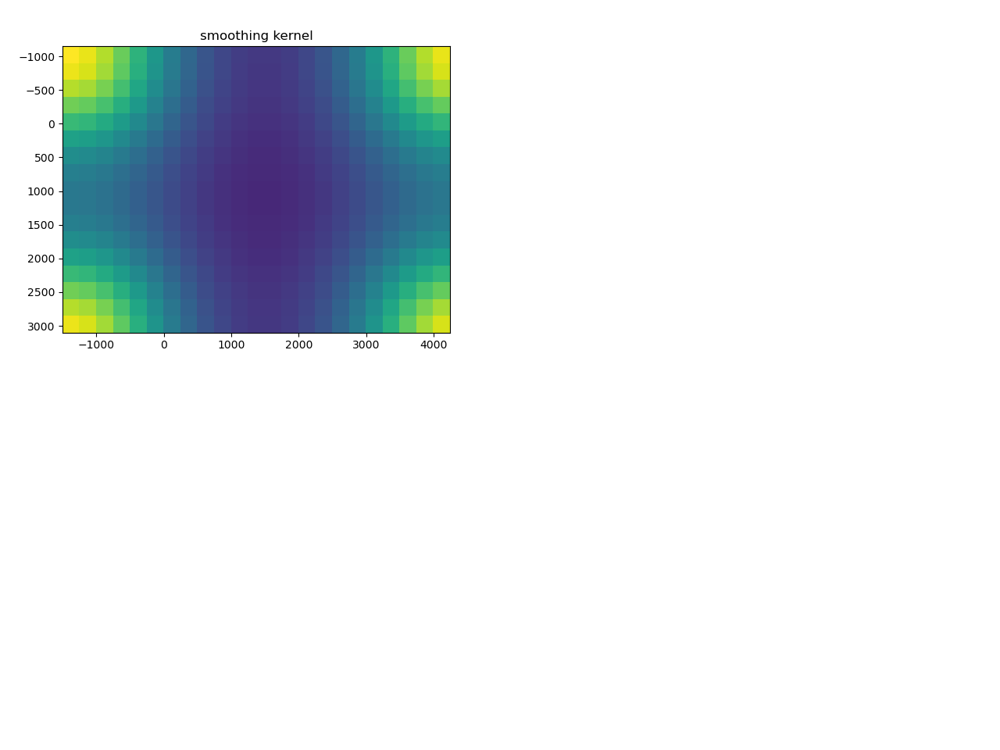

<IPython.core.display.Javascript object>


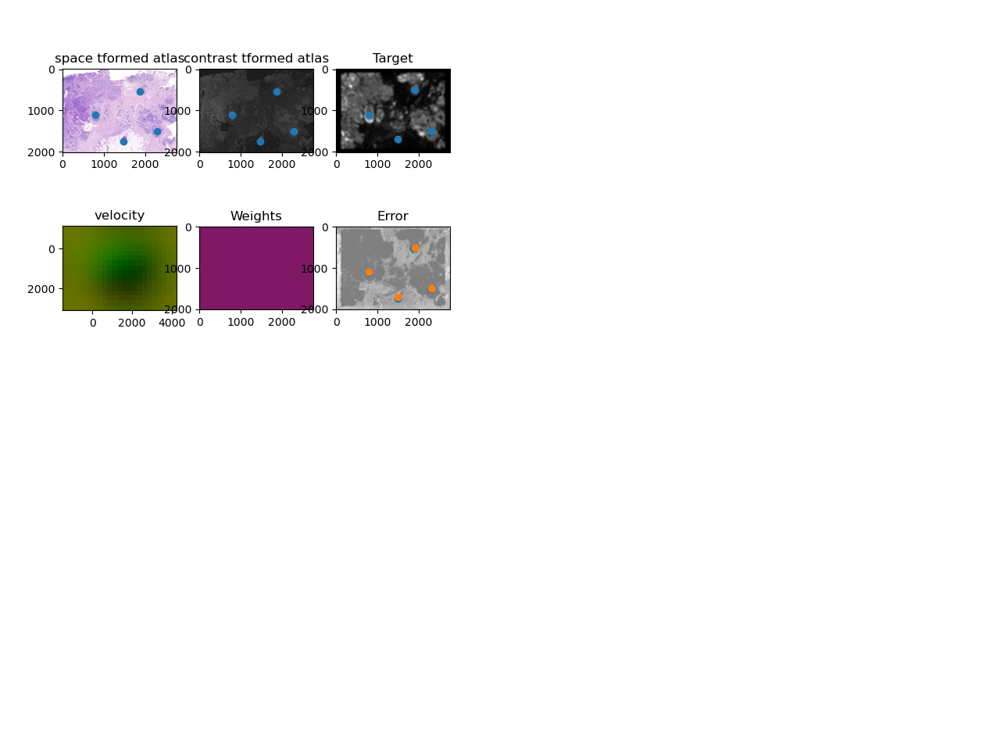

<IPython.core.display.Javascript object>


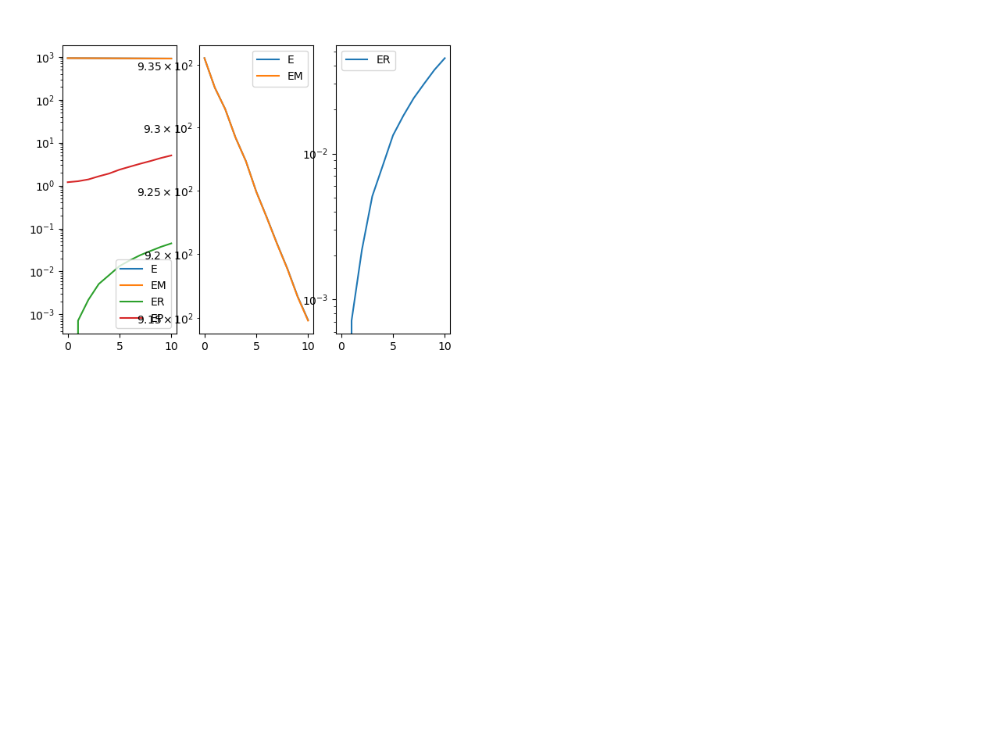

In [ ]:
# Alignment 
imp.reload(tools)
L,T = tools.L_T_from_points(pointsI,pointsJ)
device = 'cpu'
params = {'L':L,'T':T,
          'niter':1000,
          'pointsI':pointsI,
          'pointsJ':pointsJ,
          'device':device,
          'sigmaM':10.0
          }
A,v,xv = tools.LDDMM([YI,XI],I,[YJ,XJ],J,**params)

# Conclusion: still struggling with setting parameters...
# sometimes parameters lead to error: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
# axE[2].set_yscale('log')

In [326]:
print(A)
print(extentJ)

tensor([[-1.1501e+00, -4.1025e-03,  2.2993e+03],
        [ 9.2822e-02,  1.2270e+00, -4.5717e+02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e+00]], dtype=torch.float64)
(-0.5, 2757.5, 2007.5, -0.5)


<IPython.core.display.Javascript object>


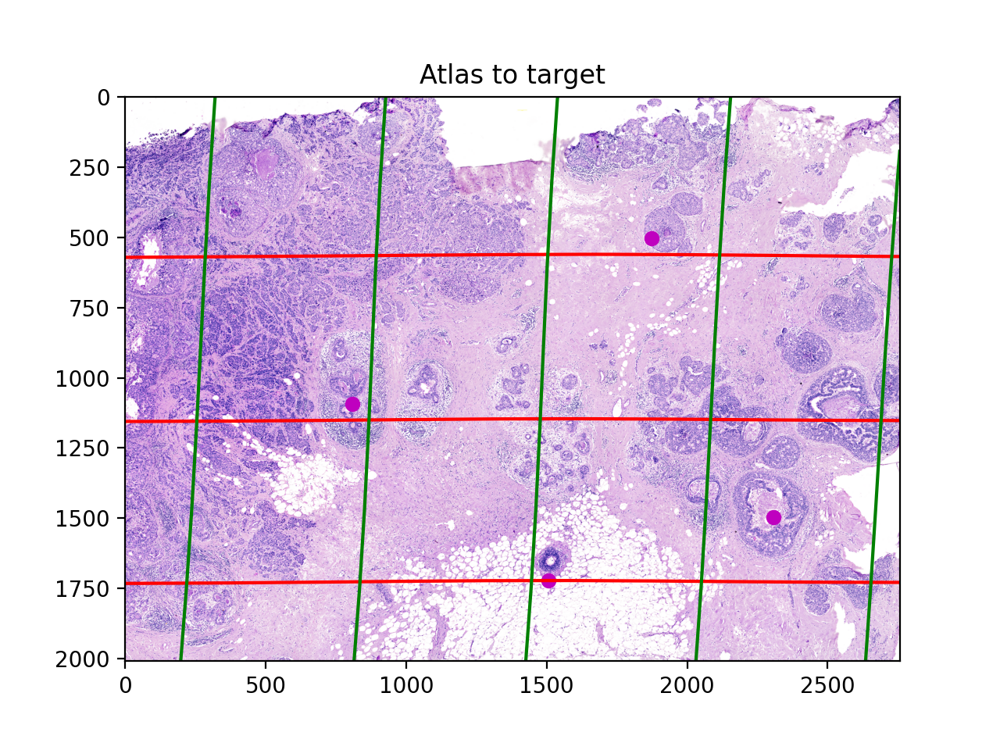

In [264]:
# now transform the image
imp.reload(tools)
levels = np.arange(-50000,50000,500)

fig,ax = plt.subplots()
phii = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='b')
phiI = tools.transform_image_atlas_to_target(xv,v,A,[YI,XI],I,[YJ,XJ])
phipointsI = tools.transform_points_atlas_to_target(xv,v,A,pointsI)

ax.contour(XJ,YJ,phii[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phii[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Atlas to target')

ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)
ax.scatter(phipointsI[:,1].detach(),phipointsI[:,0].detach(),c="m")

<IPython.core.display.Javascript object>


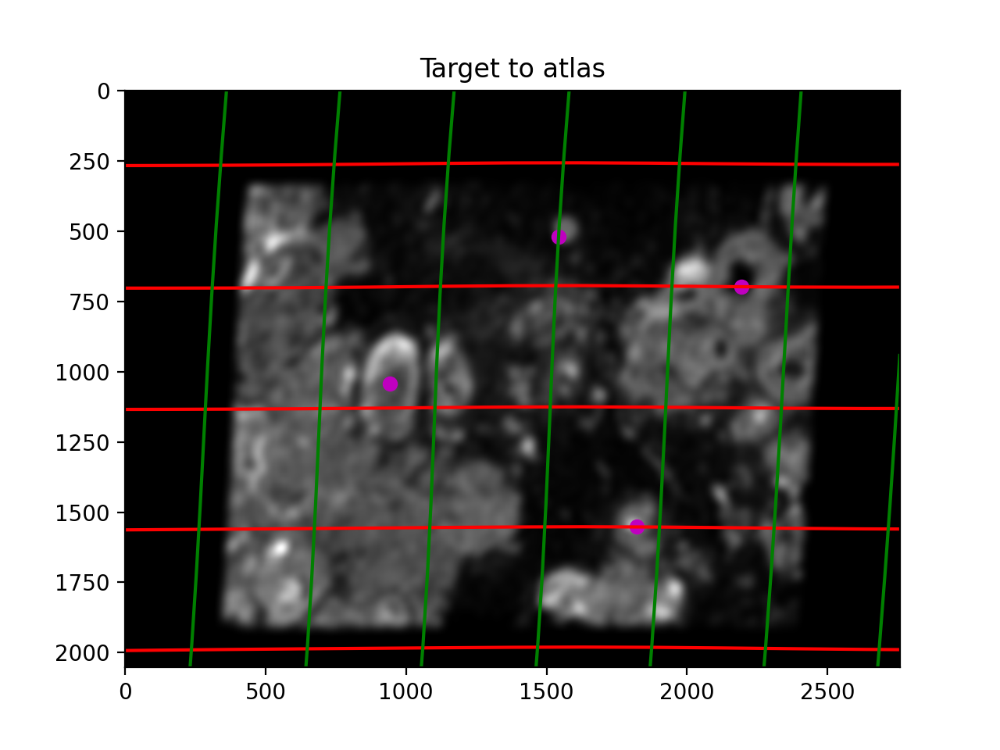

In [265]:
levels = np.arange(-50000,50000,500)

fig,ax = plt.subplots()
phi = tools.build_transform(xv,v,A,XJ=[YI,XI],direction='f')
phiiJ = tools.transform_image_target_to_atlas(xv,v,A,[YJ,XJ],J,[YI,XI])
phiipointsJ = tools.transform_points_target_to_atlas(xv,v,A,pointsJ)

ax.contour(XI,YI,phi[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XI,YI,phi[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Target to atlas')

ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
ax.scatter(phiipointsJ[:,1].detach(),phiipointsJ[:,0].detach(),c="m")

<IPython.core.display.Javascript object>


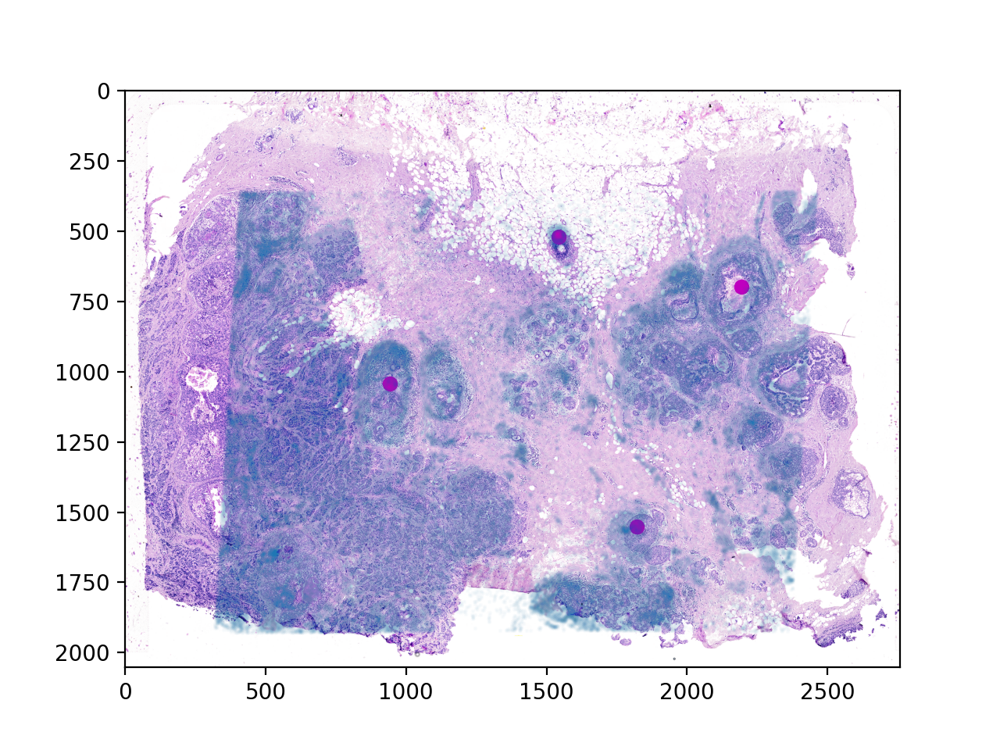

In [331]:
# Now apply to points (need help here...but in theory doable)
fig,ax = plt.subplots()
# where do I get this padding? is it from the affine?
tpointsI = tools.transform_points_target_to_atlas(xv,v,A,np.stack([yM/3+2007.5/3*0.1, xM/3+2757.5/3*0.1], -1))
phiipointsJ = tools.transform_points_target_to_atlas(xv,v,A,pointsJ)

ax.imshow((I).transpose(1,2,0),extent=extentI)
#ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
ax.scatter(phiipointsJ[:,1].detach(),phiipointsJ[:,0].detach(),c="m")
ax.scatter(tpointsI[:,1].detach(),tpointsI[:,0].detach(),s=1,alpha=0.02)

In [332]:
print(tpointsI.shape)
print(yM.shape)

torch.Size([167782, 2])
(167782,)


In [47]:
# write out results
dfout = np.stack([yM/3+2007.5/3*0.1, xM/3+2757.5/3*0.1], -1)
dfout.to_csv('xenium_STalign')
dfout

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,rowvis,colvis,Pvis
0,158338042824236264719696604356349910479,33,532.778772,617.916619,2666.520010,614.725219,621.108019,2657.545209,2675.494810,1421.670436,-33.781665,0.000000
1,260594727341160372355976405428092853003,33,1004.430016,596.808018,2763.450012,589.669218,603.946818,2757.013212,2769.886812,1409.242315,-41.606276,0.000000
2,307643940700812339199503248604719950662,33,1267.183208,578.880018,2748.978012,570.877217,586.882818,2740.489211,2757.466812,1412.233483,-44.178331,0.000000
3,30863303465976316429997331474071348973,33,1403.401822,572.616017,2766.690012,564.937217,580.294818,2756.581212,2776.798812,1410.098527,-46.037109,0.000000
4,313162718584097621688679244357302162401,33,507.949497,608.364018,2687.418010,603.061218,613.666818,2682.493210,2692.342810,1419.269594,-36.356578,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
85953,311704042603434891559886168438769992293,1545,1625.490809,9623.123579,4030.182069,9615.660779,9630.586379,4019.749269,4040.614869,1163.712963,1513.567001,0.459977
85954,312851880059098327776181257829209599759,1545,905.032435,9625.067579,4008.749469,9620.088779,9630.046379,4000.320068,4017.178869,1167.941932,1514.551663,0.465274
85955,332299915869590281339501510603978852698,1545,459.647325,9605.470978,4187.268073,9600.767578,9610.174378,4182.397273,4192.138873,1132.668771,1505.359193,0.483171
85956,150462787759670321084458536479486602685,1546,778.386670,9606.874978,4208.819338,9600.767578,9612.982378,4200.335938,4217.302738,1128.249123,1504.728934,0.480618
